In [1]:
#Import all libraries
import random
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score,balanced_accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier

import warnings
warnings.filterwarnings("ignore")
#Please ignore the warnings with version change

In [2]:
#Read training data file

trainfile = '/Users/seeratchhabra/Desktop/MSBA/Data_508/Assignment_2/Portugese_Bank_Data_TRAIN.csv'
trainData = pd.read_csv(trainfile)

#Read test data file
testfile = '/Users/seeratchhabra/Desktop/MSBA/Data_508/Assignment_2/Portugese_Bank_Data_TEST.csv'
testData = pd.read_csv(testfile)

# drop column day as it is last contact day of month which I feel does not impact marketing.. on the other hand pdays 
#-number of days since last contact is more useful

trainData.drop("day", axis=1, inplace=True)
testData.drop("day", axis=1, inplace=True)

# copy of train data and test data to perform pre processing
cpy_traindata = trainData.copy()
cpy_testdata = testData.copy()

trainData.head()

,age,job,marital,education,default,balance,housing,loan,contact,month,duration,campaign,pdays,previous,poutcome,y
0,30,unemployed,married,primary,no,1787,no,no,cellular,oct,79,1,-1,0,unknown,no
1,33,services,married,secondary,no,4789,yes,yes,cellular,may,220,1,339,4,failure,no
2,35,management,single,tertiary,no,1350,yes,no,cellular,apr,185,1,330,1,failure,no
3,30,management,married,tertiary,no,1476,yes,yes,unknown,jun,199,4,-1,0,unknown,no
4,59,blue-collar,married,secondary,no,0,yes,no,unknown,may,226,1,-1,0,unknown,no


In [3]:
#Select just Target Column from training dataset
Y = cpy_traindata.iloc[:, -1]

#Select features from training and test dataset
X = cpy_traindata.iloc[:, :-1]
X_Test_A = cpy_testdata

#split the entire training data in 
X_Train, X_Test_1, Y_Train, Y_Test_1 = train_test_split( X, Y, test_size=0.05, random_state=42)
print("Initial shape for entire data:",cpy_traindata.shape)
print("Shape of new training data:", X_Train.shape)
print("Shape of new training data:", X_Test_1.shape)

Initial shape for entire data: (4521, 16)
Shape of new training data: (4294, 15)
Shape of new training data: (227, 15)


In [4]:
print("Initial shape for entire data:",cpy_traindata.shape)
print("Shape of new training data:", X_Train.shape)
print("Shape of new training data:", X_Test_1.shape)

Initial shape for entire data: (4521, 16)
Shape of new training data: (4294, 15)
Shape of new training data: (227, 15)


In [3]:
# check if same columns are present in Train and Test Data 
trainData.columns.difference(testData.columns)
# All should be same

Index([], dtype='object')

In [4]:
#Shape and data types of data
print("Training Data shape:",trainData.shape)
print("Test Data shape:",testData.shape)
print("Training Data types:",trainData.dtypes)
# variable data types
trainData.describe()

Training Data shape: (4521, 16)
Test Data shape: (45211, 16)
Training Data types: age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object


,age,balance,duration,campaign,pdays,previous
count,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000
mean,41.170095,1422.657819,263.961292,2.793630,39.766645,0.542579
std,10.576211,3009.638142,259.856633,3.109807,100.121124,1.693562
min,19.000000,-3313.000000,4.000000,1.000000,-1.000000,0.000000
25%,33.000000,69.000000,104.000000,1.000000,-1.000000,0.000000
50%,39.000000,444.000000,185.000000,2.000000,-1.000000,0.000000
75%,49.000000,1480.000000,329.000000,3.000000,-1.000000,0.000000
max,87.000000,71188.000000,3025.000000,50.000000,871.000000,25.000000


-----------------------------
job
admin.           10.572882
blue-collar      20.924574
entrepreneur      3.715992
housemaid         2.477328
management       21.433311
retired           5.087370
self-employed     4.047777
services          9.223623
student           1.857996
technician       16.987392
unemployed        2.831232
unknown           0.840522
Name: job, dtype: float64


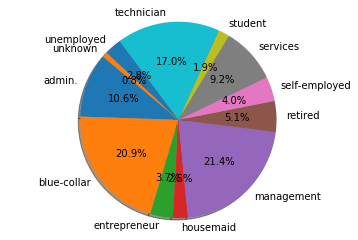

-----------------------------
marital
divorced    11.678832
married     61.866844
single      26.454324
Name: marital, dtype: float64


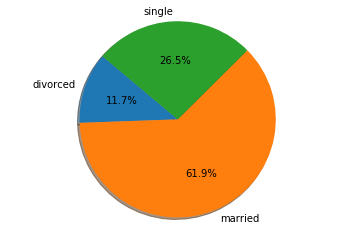

-----------------------------
education
primary      14.996682
secondary    51.006415
tertiary     29.860650
unknown       4.136253
Name: education, dtype: float64


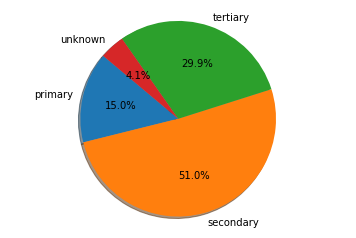

-----------------------------
default
no     98.318956
yes     1.681044
Name: default, dtype: float64


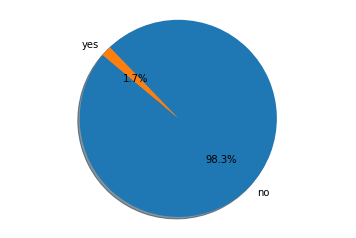

-----------------------------
housing
no     43.397478
yes    56.602522
Name: housing, dtype: float64


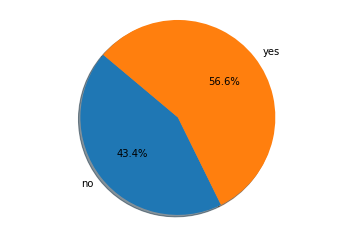

-----------------------------
loan
no     84.715771
yes    15.284229
Name: loan, dtype: float64


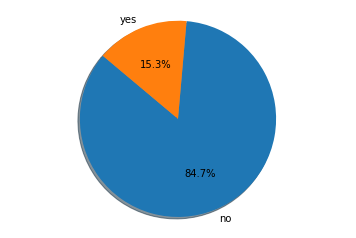

-----------------------------
month
apr     6.480867
aug    14.001327
dec     0.442380
feb     4.910418
jan     3.273612
jul    15.616014
jun    11.745189
mar     1.083831
may    30.922362
nov     8.604291
oct     1.769520
sep     1.150188
Name: month, dtype: float64


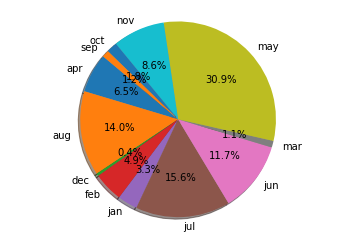

-----------------------------
contact
cellular     64.056625
telephone     6.657819
unknown      29.285556
Name: contact, dtype: float64


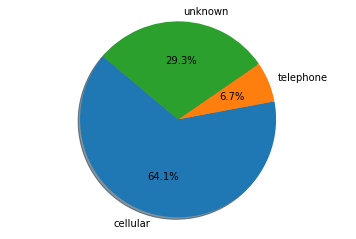

-----------------------------
poutcome
failure    10.838310
other       4.357443
success     2.853351
unknown    81.950896
Name: poutcome, dtype: float64


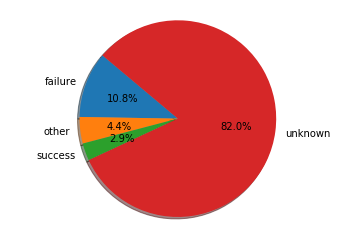

In [22]:
#summary of categorical variables in training data
categoricalFeatures = ["job", "marital", 'education', "default", "housing", "loan","month",'contact', 'poutcome']
for col in categoricalFeatures:
    print("-----------------------------")
    print(trainData.groupby(col)[col].count()/len(trainData) * 100)
    df = pd.DataFrame(trainData.groupby(col)[col].count()/len(trainData) * 100)
    labels = df.index
    sizes = df[col]
    # Plot
    plt.pie(sizes, labels=labels,
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.axis('equal')
    plt.show()

    

In [23]:
# Percentage split of target variable
per_split = pd.DataFrame(trainData.groupby('y')['y'].count())
per_split['y_per'] = 100*per_split['y']/trainData.shape[0]
per_split
# unbalanced dataset

,y,y_per
y,,
no,4000,88.476001
yes,521,11.523999


In [24]:
# check if there are any missing values in any column
print("Number of null values in train data",trainData.isnull().sum().sum())
print("Number of null values in test data",testData.isnull().sum().sum())
# no missing values

Number of null values in train data 0
Number of null values in test data 0


{'whiskers': [<matplotlib.lines.Line2D at 0x1a1ddca710>,
 'caps': [<matplotlib.lines.Line2D at 0x1a1ddcada0>,
 'boxes': [<matplotlib.lines.Line2D at 0x1a1ddca2e8>],
 'medians': [<matplotlib.lines.Line2D at 0x1a1ebb4470>],
 'fliers': [<matplotlib.lines.Line2D at 0x1a1ebb47b8>],
 'means': []}

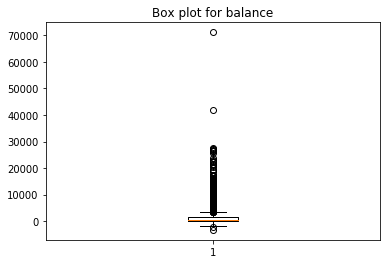

In [25]:
#exploring numerical data
fig1, ax1 = plt.subplots()
ax1.set_title('Box plot for balance')
ax1.boxplot(trainData['balance'])

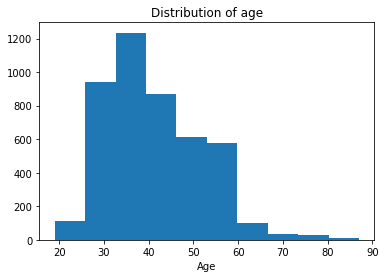

In [26]:
# distribution of age
plt.hist(trainData['age'])
plt.title("Distribution of age")
plt.xlabel('Age')
plt.show()

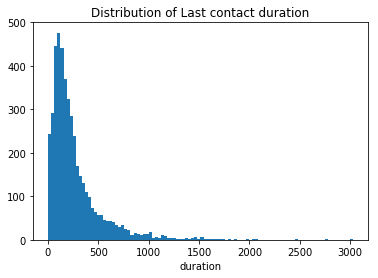

In [27]:
# distribution of duration
plt.hist(trainData['duration'],bins= 100)
plt.title("Distribution of Last contact duration")
plt.xlabel('duration')
plt.show()

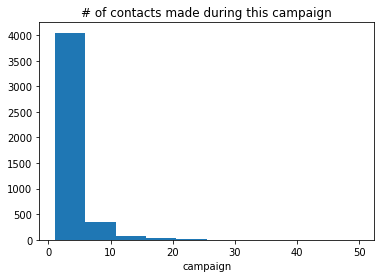

In [28]:
# distribution of campaign
plt.hist(trainData['campaign'])
plt.title("# of contacts made during this campaign")
plt.xlabel('campaign')
plt.show()

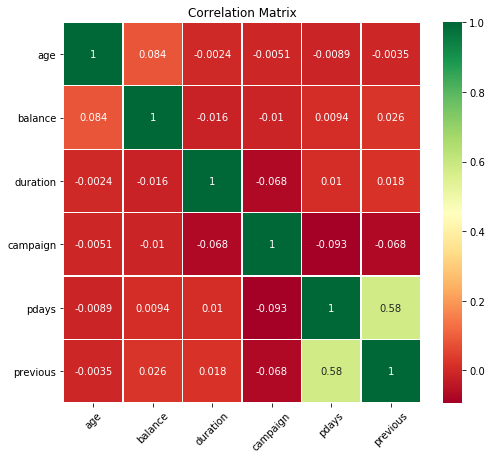

In [29]:
corr_data = trainData
corr = corr_data.corr()

cor_plot = sns.heatmap(corr,annot=True,cmap='RdYlGn',linewidths=0.2,annot_kws={'size':10})
fig=plt.gcf()
fig.set_size_inches(8,7)
plt.xticks(fontsize=10,rotation=45)
plt.yticks(fontsize=10)
plt.title('Correlation Matrix')
plt.show()

In [30]:
#List of Categorical Features
categoricalFeatures = ["job", "marital", 'education', "default", "housing", "loan","month",'contact', 'poutcome']

#Combine Train and test for one Hot Encoding
combined_Data = pd.concat([cpy_traindata,cpy_testdata], keys=[0,1])

#Do one Hot encoding for categorical features
combined_Data = pd.get_dummies(combined_Data,columns=categoricalFeatures)

#Separate Train data and test data
X_train = combined_Data.xs(0)
X_test = combined_Data.xs(1)

print("Test data",X_test.shape)
print("Training data", X_train.shape)

Test data (45211, 50)
Training data (4521, 50)


In [31]:
# change yes and no in Target column (y) to 1 and 0 respectively
trainData['y'] = trainData['y'].map({'yes': 1, 'no': 0})
testData['y'] = testData['y'].map({'yes': 1, 'no': 0})

In [32]:
# Get target column 
Y_train = trainData["y"]
Y_test = testData["y"]
print("Test data",Y_test.shape)
print("Training data", Y_train.shape)

Test data (45211,)
Training data (4521,)


In [33]:
#Make default decision tree using training dataset
clf = DecisionTreeClassifier()
clf.fit(X_train, Y_train)

#Prediction on training data
pred=pd.DataFrame(clf.predict(X_train),columns=["Prediction"])
print("----------------------------Decision Tree - Training Data------------------------------------------------\n")
print("Accuracy Score on training data using Decision Tree:",accuracy_score(Y_train,pred["Prediction"]))
print("Confusion Matrix on training data using Decision Tree\n", confusion_matrix(Y_train,pred["Prediction"]))

# prediction on test data
pred=pd.DataFrame(clf.predict(X_test),columns=["Prediction"])
print("----------------------------Decision Tree - Test Data------------------------------------------------\n")
print("Accuracy Score on test data using Decision Tree:",accuracy_score(Y_test,pred["Prediction"]))
print("Balanced Accuracy Score on test data using Decision Tree:",balanced_accuracy_score(Y_test,pred["Prediction"]))
print("Confusion Matrix on test data using Decision Tree\n", confusion_matrix(Y_test,pred["Prediction"]))
print("Classification report\n", classification_report(Y_test,pred["Prediction"]))

----------------------------Decision Tree - Training Data------------------------------------------------

Accuracy Score on training data using Decision Tree: 1.0
Confusion Matrix on training data using Decision Tree
 [[4000    0]
 [   0  521]]
----------------------------Decision Tree - Test Data------------------------------------------------

Accuracy Score on test data using Decision Tree: 0.8801397889894053
Balanced Accuracy Score on test data using Decision Tree: 0.7202126795199211
Confusion Matrix on test data using Decision Tree
 [[37087  2835]
 [ 2584  2705]]
Classification report
               precision    recall  f1-score   support

           0       0.93      0.93      0.93     39922
           1       0.49      0.51      0.50      5289

   micro avg       0.88      0.88      0.88     45211
   macro avg       0.71      0.72      0.72     45211
weighted avg       0.88      0.88      0.88     45211



In [34]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
dt_feature_names = list(X_train.columns)
dt_target_names = [str(s) for s in Y_train.unique()]
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=dt_feature_names, class_names=dt_target_names)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


In [203]:
#get default parameters
clf.get_params()

{'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': False,
 'random_state': None,
 'splitter': 'best'}

In [37]:
# For this particular example, i want my precision to be more for who will buy..
#I want to correctly predict more people who will actually buy
#Hyperparameter tuning done for decision tree classifier
#RANDOM SEARCH--------------------------------------------

print("RandomizedSearchCV-Decision tree")
parameters={'max_depth': range(10,100,10), 'min_samples_leaf' : range(2,30,5), 'criterion':['gini','entropy']}
clf_random = RandomizedSearchCV(clf,parameters,n_iter=30, cv=8, scoring ="precision")
clf_random.fit(X_train, Y_train)
rand_parm=clf_random.best_params_
print(rand_parm)

#GRID SEARCH----------------------------------------
print("GridSearchCV-Decision tree")
clf_grid = GridSearchCV(clf,parameters, scoring ="precision")
clf_grid.fit(X_train, Y_train)
grid_parm=clf_grid.best_params_
print(grid_parm)

RandomizedSearchCV-Decision tree
{'min_samples_leaf': 12, 'max_depth': 10, 'criterion': 'entropy'}
GridSearchCV-Decision tree
{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 22}


In [38]:
#Using the parameters obtained from HyperParameterTuning in the DecisionTreeClassifier 
clf_g = DecisionTreeClassifier(**grid_parm)
clf_r = DecisionTreeClassifier(**rand_parm)
#grid model
clf_g.fit(X_train,Y_train)
clf_g_predict = clf_g.predict(X_test)

# random model
clf_r.fit(X_train,Y_train)
clf_r_predict = clf_r.predict(X_test)

print("----------------------------Hypertuning using Grid Search------------------------------------------------\n")
#Grid model Prediction on training data
pred_g=pd.DataFrame(clf_g.predict(X_train),columns=["Prediction"])
print("Accuracy Score on training data using Decision Tree - Grid Search:",accuracy_score(Y_train,pred_g["Prediction"]))
print("Confusion Matrix on training data using Decision Tree - Grid Search\n", confusion_matrix(Y_train,pred_g["Prediction"]))

# grid model prediction on test data
pred_g=pd.DataFrame(clf_g.predict(X_test),columns=["Prediction"])
print("Accuracy Score on test data using Decision Tree - Grid Search:",accuracy_score(Y_test,pred_g["Prediction"]))
print("Balanced Accuracy Score on test data using Decision Tree - Grid Search:",balanced_accuracy_score(Y_test,pred_g["Prediction"]))
print("Confusion Matrix on test data using Decision Tree - Grid Search\n", confusion_matrix(Y_test,pred_g["Prediction"]))
print("Classification report on test data using Decision Tree - Grid Search\n", classification_report(Y_test,pred_g["Prediction"]))

print("\n--------------------------Hypertuning using Random Search------------------------------------------------\n")
#Random model Prediction on training data
pred_r=pd.DataFrame(clf_r.predict(X_train),columns=["Prediction"])
print("Accuracy Score on training data using Decision Tree - Random Search:",accuracy_score(Y_train,pred_r["Prediction"]))
print("Confusion Matrix on training data using Decision Tree - Random Search\n", confusion_matrix(Y_train,pred_r["Prediction"]))

# Random model prediction on test data
pred_r=pd.DataFrame(clf_r.predict(X_test),columns=["Prediction"])
print("Accuracy Score on test data using Decision Tree - Random Search:",accuracy_score(Y_test,pred_r["Prediction"]))
print("Balanced Accuracy Score on test data using Decision Tree - Random Search:",balanced_accuracy_score(Y_test,pred_r["Prediction"]))
print("Confusion Matrix on test data using Decision Tree - Random Search\n", confusion_matrix(Y_test,pred_r["Prediction"]))
print("Classification report on test data using Decision Tree - Random Search\n", classification_report(Y_test,pred_r["Prediction"]))

----------------------------Hypertuning using Grid Search------------------------------------------------

Accuracy Score on training data using Decision Tree - Grid Search: 0.9130723291307233
Confusion Matrix on training data using Decision Tree - Grid Search
 [[3916   84]
 [ 309  212]]
Accuracy Score on test data using Decision Tree - Grid Search: 0.8997589082302979
Balanced Accuracy Score on test data using Decision Tree - Grid Search: 0.6563634168875478
Confusion Matrix on test data using Decision Tree - Grid Search
 [[38888  1034]
 [ 3498  1791]]
Classification report on test data using Decision Tree - Grid Search
               precision    recall  f1-score   support

           0       0.92      0.97      0.94     39922
           1       0.63      0.34      0.44      5289

   micro avg       0.90      0.90      0.90     45211
   macro avg       0.78      0.66      0.69     45211
weighted avg       0.88      0.90      0.89     45211


--------------------------Hypertuning using 

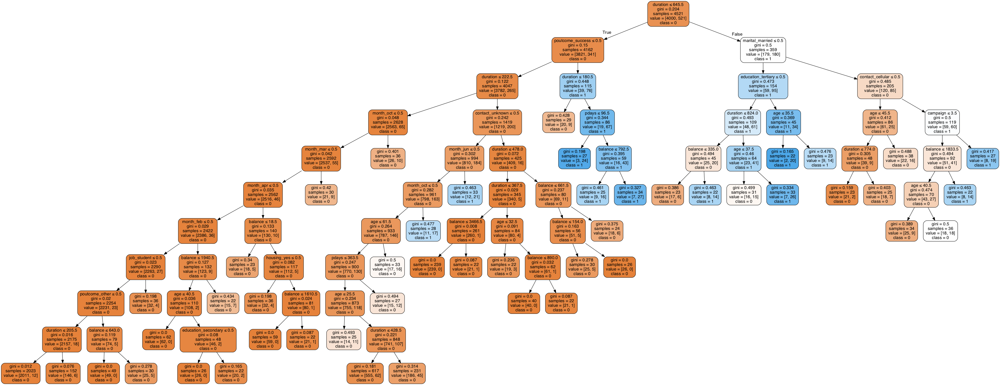

In [39]:
# decision tree using gini search
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
dt_feature_names = list(X_train.columns)
dt_target_names = [str(s) for s in Y_train.unique()]
export_graphviz(clf_g, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=dt_feature_names, class_names=dt_target_names)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [55]:
# cross validation of grid search balanced accuracy
clf_cv_score_g = cross_val_score(clf_g, X_train, Y_train, cv=10, scoring="precision")
print(clf_cv_score_g)
print("Average precision on training data with Grid search: ", clf_cv_score_g.mean())
print('\n')
# cross validation of random search
clf_cv_score_r = cross_val_score(clf_r, X_train, Y_train, cv=10, scoring="precision")
print(clf_cv_score_r)
print("Average precision on training data with random search: ", clf_cv_score_r.mean())
print('\n')
# cross validation of default model
clf_cv_score = cross_val_score(clf, X_train, Y_train, cv=10, scoring="precision")
print(clf_cv_score)
print("Average precision on training data with default model: ", clf_cv_score.mean())
print('\n')


[0.47058824 0.75757576 0.65625    0.5625     0.55       0.61111111
 0.48275862 0.66666667 0.63333333 0.64864865]
Average precision on training data with Grid search:  0.603943237331929


[0.56756757 0.61290323 0.54285714 0.55263158 0.58333333 0.67741935
 0.57142857 0.67567568 0.46875    0.625     ]
Average precision on training data with random search:  0.587756645045482


[0.39583333 0.41304348 0.42553191 0.36206897 0.43103448 0.46666667
 0.47826087 0.64444444 0.34       0.390625  ]
Average precision on training data with default model:  0.4347509155440011




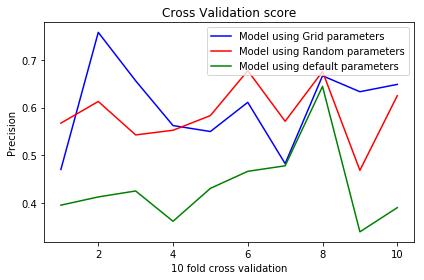

In [56]:
# plot to compare grid and random parameters
plt.plot([1,2,3,4,5,6,7,8,9,10], clf_cv_score_g, label="Model using Grid parameters", color="blue")
plt.plot([1,2,3,4,5,6,7,8,9,10], clf_cv_score_r, label="Model using Random parameters", color="red")
plt.plot([1,2,3,4,5,6,7,8,9,10], clf_cv_score, label="Model using default parameters", color="green")
plt.title("Cross Validation score")
plt.ylabel("Precision")
plt.xlabel("10 fold cross validation")
plt.tight_layout()
plt.legend(loc="best")
plt.show()

In [60]:
#Random forest
rfc = RandomForestClassifier()
rfc.fit(X_train, Y_train)

#Prediction on training data
pred=pd.DataFrame(rfc.predict(X_train),columns=["Prediction"])
print("----------------------------Random Forest: Training Data------------------------------------------------\n")
print("Accuracy Score on training data using Random Forest:",accuracy_score(Y_train,pred["Prediction"]))
print("Confusion Matrix on training data using Random Forest\n", confusion_matrix(Y_train,pred["Prediction"]))

# prediction on test data
pred=pd.DataFrame(rfc.predict(X_test),columns=["Prediction"])
print("----------------------------Random Forest: Test Data------------------------------------------------\n")
print("Accuracy Score on test data using Random Forest:",accuracy_score(Y_test,pred["Prediction"]))
print("Balanced Accuracy Score on test data using Random Forest:",balanced_accuracy_score(Y_test,pred["Prediction"]))
print("Confusion Matrix on test data using Random Forest\n", confusion_matrix(Y_test,pred["Prediction"]))
print("Classification report on test data using Random Forest\n", classification_report(Y_test,pred["Prediction"]))


----------------------------Random Forest: Training Data------------------------------------------------

Accuracy Score on training data using Random Forest: 0.9900464499004645
Confusion Matrix on training data using Random Forest
 [[3998    2]
 [  43  478]]
----------------------------Random Forest: Test Data------------------------------------------------

Accuracy Score on test data using Random Forest: 0.904337440003539
Balanced Accuracy Score on test data using Random Forest: 0.653297185325338
Confusion Matrix on test data using Random Forest
 [[39164   758]
 [ 3567  1722]]
Classification report on test data using Random Forest
               precision    recall  f1-score   support

           0       0.92      0.98      0.95     39922
           1       0.69      0.33      0.44      5289

   micro avg       0.90      0.90      0.90     45211
   macro avg       0.81      0.65      0.70     45211
weighted avg       0.89      0.90      0.89     45211



In [193]:
rfc.get_params()

{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 10,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [49]:
#Hyperparameter tuning done for random forest classifier
#RANDOM SEARCH--------------------------------------------

print("RandomizedSearchCV-Decision tree")
parameters={'max_features': range(10,50,5) ,'n_estimators':[25,30,40,50], 'criterion':['gini','entropy']}
rfc_random = RandomizedSearchCV(rfc,parameters,n_iter=30,cv=5, scoring ='precision')
rfc_random.fit(X_train, Y_train)
rand_parm_rfc=rfc_random.best_params_
print(rand_parm_rfc)

#GRID SEARCH----------------------------------------
print("GridSearchCV-Decision tree")
rfc_grid = GridSearchCV(rfc,parameters,scoring ='precision')
rfc_grid.fit(X_train, Y_train)
grid_parm_rfc=rfc_grid.best_params_
print(grid_parm_rfc)

RandomizedSearchCV-Decision tree
{'n_estimators': 40, 'max_features': 10, 'criterion': 'entropy'}
GridSearchCV-Decision tree
{'criterion': 'entropy', 'max_features': 10, 'n_estimators': 50}


In [64]:
#Using the parameters obtained from HyperParameterTuning in the DecisionTreeClassifier 
rfc_g = RandomForestClassifier(**grid_parm_rfc)
rfc_r = RandomForestClassifier(**rand_parm_rfc)
#grid model
rfc_g.fit(X_train,Y_train)
rfc_g_predict = rfc_g.predict(X_test)

# random model
rfc_r.fit(X_train,Y_train)
rfc_r_predict = rfc_r.predict(X_test)

print("----------------------------Hypertuning using Grid Search------------------------------------------------\n")
#Grid model Prediction on training data
pred_g_rfc=pd.DataFrame(rfc_g.predict(X_train),columns=["Prediction"])
print("Accuracy Score on training data using Random Forest - Grid Search:",accuracy_score(Y_train,pred_g_rfc["Prediction"]))
print("Confusion Matrix on training data using Random Forest - Grid Search\n", confusion_matrix(Y_train,pred_g_rfc["Prediction"]))
#print("Classification report on traininf data using Random Forest - Grid Search\n", classification_report(Y_train,pred_g_rfc["Prediction"]))

# grid model prediction on test data
pred_g_rfc=pd.DataFrame(rfc_g.predict(X_test),columns=["Prediction"])
print("Accuracy Score on test data using Random Forest - Grid Search:",accuracy_score(Y_test,pred_g_rfc["Prediction"]))
print("Balanced Accuracy Score on test data using Random Forest - Grid Search:",balanced_accuracy_score(Y_test,pred_g_rfc["Prediction"]))
print("Confusion Matrix on test data using Random Forest - Grid Search\n", confusion_matrix(Y_test,pred_g_rfc["Prediction"]))
print("Classification report on test data using Random Forest - Grid Search\n", classification_report(Y_test,pred_g_rfc["Prediction"]))


print("\n--------------------------Hypertuning using Random Search------------------------------------------------\n")
#Random model Prediction on training data
pred_r_rfc=pd.DataFrame(rfc_r.predict(X_train),columns=["Prediction"])
print("Accuracy Score on training data using Random Forest - Random Search:",accuracy_score(Y_train,pred_r_rfc["Prediction"]))
print("Confusion Matrix on training data using Random Forest - Random Search\n", confusion_matrix(Y_train,pred_r_rfc["Prediction"]))


# Random model prediction on test data
pred_r_rfc=pd.DataFrame(rfc_r.predict(X_test),columns=["Prediction"])
print("Accuracy Score on test data using Random Forest - Random Search:",accuracy_score(Y_test,pred_r_rfc["Prediction"]))
print("Balanced Accuracy Score on test data using Random Forest - Random Search:",balanced_accuracy_score(Y_test,pred_r_rfc["Prediction"]))
print("Confusion Matrix on test data using Random Forest - Random Search\n", confusion_matrix(Y_test,pred_r_rfc["Prediction"]))
print("Classification report on test data using Random Forest - Random Search\n", classification_report(Y_test,pred_r_rfc["Prediction"]))


----------------------------Hypertuning using Grid Search------------------------------------------------

Accuracy Score on training data using Random Forest - Grid Search: 1.0
Confusion Matrix on training data using Random Forest - Grid Search
 [[4000    0]
 [   0  521]]
Accuracy Score on test data using Random Forest - Grid Search: 0.9104863860564907
Balanced Accuracy Score on test data using Random Forest - Grid Search: 0.6860570469193146
Confusion Matrix on test data using Random Forest - Grid Search
 [[39085   837]
 [ 3210  2079]]
Classification report on test data using Random Forest - Grid Search
               precision    recall  f1-score   support

           0       0.92      0.98      0.95     39922
           1       0.71      0.39      0.51      5289

   micro avg       0.91      0.91      0.91     45211
   macro avg       0.82      0.69      0.73     45211
weighted avg       0.90      0.91      0.90     45211


--------------------------Hypertuning using Random Search--

In [58]:
# cross validation of grid search balanced accuracy
rfc_cv_score_g = cross_val_score(rfc_g, X_train, Y_train, cv=10, scoring="precision")
print(rfc_cv_score_g)
print("Average precision on training data with Grid search: ", rfc_cv_score_g.mean())
print('\n')
# cross validation of random search
rfc_cv_score_r = cross_val_score(rfc_r, X_train, Y_train, cv=10, scoring="precision")
print(rfc_cv_score_r)
print("Average precision on training data with random search: ", rfc_cv_score_r.mean())
print('\n')
# cross validation of default model
rfc_cv_score = cross_val_score(rfc, X_train, Y_train, cv=10, scoring="precision")
print(rfc_cv_score)
print("Average precision on training data with default model: ", rfc_cv_score.mean())
print('\n')


[0.70833333 0.63636364 0.45454545 0.65625    0.62068966 0.64705882
 0.54545455 0.73913043 0.72727273 0.65      ]
Average precision on training data with Grid search:  0.6385098610454132


[0.70833333 0.8        0.47058824 0.57142857 0.61290323 0.66666667
 0.47058824 0.75       0.64       0.65217391]
Average precision on training data with random search:  0.6342682180866736


[0.63333333 0.72222222 0.44444444 0.66666667 0.4137931  0.63636364
 0.47368421 0.7037037  0.56521739 0.5       ]
Average precision on training data with default model:  0.5759428712012946




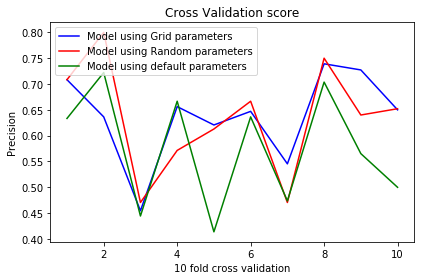

In [59]:
# plot to compare grid and random parameters
plt.plot([1,2,3,4,5,6,7,8,9,10], rfc_cv_score_g, label="Model using Grid parameters", color="blue")
plt.plot([1,2,3,4,5,6,7,8,9,10], rfc_cv_score_r, label="Model using Random parameters", color="red")
plt.plot([1,2,3,4,5,6,7,8,9,10], rfc_cv_score, label="Model using default parameters", color="green")
plt.title("Cross Validation score")
plt.ylabel("Precision")
plt.xlabel("10 fold cross validation")
plt.tight_layout()
plt.legend(loc="best")
plt.show()